<h1><center>Laboratorio 4: Spark y EDA</center></h1>

<center><strong>MDS7202: Laboratorio de Programación Científica para Ciencia de Datos - Primavera 2024</strong></center>

### Cuerpo Docente:

- Profesores: Ignacio Meza, Sebastián Tinoco
- Auxiliar: Eduardo Moya
- Ayudantes: Nicolás Ojeda, Melanie Peña, Valentina Rojas

### Equipo: Ratas.py 🐁

- Nombre de alumno 1: Geraldyn Pérez
- Nombre de alumno 2: Diego Rojas


### **Link de repositorio de GitHub:** [Repositorio](https://github.com/Geral37/MDS7202.git)

## Reglas:

- **Grupos de 2 personas**
- Fecha de entrega: 6 días de plazo con descuento de 1 punto por día. Entregas Jueves a las 23:59.
- Instrucciones del lab el viernes a las 16:15 en formato online. Asistencia no es obligatoria.
- <u>Prohibidas las copias</u>. Cualquier intento de copia será debidamente penalizado con el reglamento de la escuela.
- Tienen que subir el laboratorio a u-cursos y a su repositorio de github. Labs que no estén en u-cursos no serán revisados. Recuerden que el repositorio también tiene nota.
- Cualquier duda fuera del horario de clases al foro. Mensajes al equipo docente serán respondidos por este medio.
- Pueden usar cualquier material del curso que estimen conveniente.

### Temas a tratar

- Introducción al manejo y análisis de grandes volúmenes de datos por medio de la libreria `pyspark`.

### Objetivos principales del laboratorio

- Entender, aplicar y aprovechar las ventajas que nos ofrece la libreria `pyspark` para manejar datos tabulares de gran volúmen.
- Crear gráficos para el desarrollo de Análisis de Datos Exploratorios (EDA).

### Datos del Lab

- Base de datos: https://gitlab.com/imezadelajara/datos_clase_7_mds7202/-/raw/main/datos_lab_spark.parquet
- Objeto serializado: https://gitlab.com/imezadelajara/datos_clase_7_mds7202/-/raw/main/object.pkl

## 1. Preguntas Teóricas [12 puntos]
(2 por pregunta)

<center>
<img src="https://img.buzzfeed.com/buzzfeed-static/static/2018-08/1/17/enhanced/buzzfeed-prod-web-05/anigif_enhanced-9173-1533160033-1.gif" width=350 />



Responda en  máximo 5 líneas las siguientes preguntas:
1. ¿Qué es Apache Spark y cuáles son sus principales ventajas sobre Pandas?
2. ¿Qué es un RDD en Spark? Describe una de sus principales características. ¿Qué tienen que ver con los dataframes?.
3. Diferencia entre transformaciones y acciones en Spark. Proporciona ejemplos de cada una. ¿Qué ocurre internamente cuando se ejecuta una acción?
4. Explica la importancia del particionamiento en Spark y cómo afecta el rendimiento del procesamiento de datos.
5. ¿Cuáles son las funciones de Spark Driver y Spark Executor?
6. ¿Qué es el Catalyst Optimizer en Apache Spark y cuál es su función principal en la optimización de consultas SQL?


**Respuestas**

> Respuestas aquí

1. Apache Spark es un potente motor unificado, diseñado para el procesamiento de datos a gran escala, tanto en centros de datos físicos como en entornos de nube.

    Apache Spark se enfoca en el paralelismo para el procesamiento veloz  mientras que Pandas está limitado a la memoria de una sola máquina.
    Apache Spark esta diseñado para trabajar con un gran volumen de datos, mientras que pandas solo tolera un volumen moderado de datos.

2. Un RDD (Resilient Distributed Dataset) es una colección distribuida e inmutable de elementos que constituye el pilar fundamental de Apache Spark.
Una de las caractiristicas principales de un RDD es que está dividido en particiones, lo que permite procesar los datos en paralelo en varios nodos, mejorando la eficiencia y escalabilidad.
Los dataframes se construyen en base a los RDD, por ejemplo, un conjunto de estructuras RDD pueden formar una columna.

3. Las transformaciones crean nuevos dataframes a partir de los existentes sin modificar el original y se almacenan hasta que se invoque una acción. Las acciones, por otro lado, desencadenan la ejecución de todas las transformaciones acumuladas, procesando los datos y produciendo un resultado final. Por ejemplo, una transformación sería select(), mientra que una acción seria show().

    Cuando se ejecuta una acción en Spark, se construye y optimiza un plan de ejecución a partir de las transformaciones previas, se distribuyen tareas entre los nodos y se ejecutan en paralelo. Finalmente, los resultados se recopilan y se devuelven a la acción que las solicitó.

4. El particionamiento en Spark es crucial porque distribuye los datos en múltiples nodos del cluster, permitiendo un procesamiento paralelo y eficiente. Un buen particionamiento asegura que los datos se distribuyan de manera equilibrada, lo que optimiza el uso de recursos y reduce el tiempo de procesamiento. Un particionamiento inadecuado puede llevar a desequilibrios en la carga de trabajo y a cuellos de botella, afectando negativamente el rendimiento general.

5. El Spark Driver es el núcleo de una aplicación Spark, responsable de instanciar la SparkSession, solicitar recursos al gestor del clúster, y convertir las operaciones del código en gráficos acíclicos dirigidos (DAGs) para una ejecución eficiente de las tareas.

    El Spark Executor opera en cada nodo del clúster, ejecutando tareas asignadas por el Spark Driver. Es responsable de procesar datos en su nodo y devolver los resultados al Driver.

6. El Catalyst Optimizer es un componente del motor SQL de Apache Spark, conocido como Spark SQL. Es una herramienta potente que se utiliza para optimizar el rendimiento de las consultas en Spark. Su función principal es transformar y optimizar los planes de ejecución de consultas SQL para que se ejecuten de manera más eficiente.

## Parte Práctica



<center>
<img src="https://pbs.twimg.com/ad_img/1285681293590749189/kDckYy6Z?format=png&name=900x900" width=350 />

Juan Carlos Bodoque, el famoso periodista y empresario, decidió diversificar su portafolio de negocios y crear su propia plataforma de e-commerce. Después de varios años de investigar y analizar el mercado financiero, finalmente logró fundar Bodoque E-Shop con el objetivo de ofrecer a sus clientes una experiencia personalizada y confiable en sus transacciones.

Sin embargo, con la llegada de los aliens al planeta Tierra, aparecen nuevos desafíos para el negocio. Por ello, Bodoque decide invertir en un equipo de expertos en tecnología y comercio interplanetario, para que Bodoque Shop implemente las últimas innovaciones en servicio al cliente para garantizar la satisfacción y fidelización de sus nuevos clientes.

El primer objetivo de Bodoque E-Shop será la hacer un análisis exploratorio para entender mejor el comportamiento de los usuarios en la plataforma. Para ello Bodoque les hace entrega de un extenso dataset en el que se registran las actividades que han realizado sus clientes durante los últimos meses. A continuación se presenta un diccionario de variables que levanto el equipo de consultores interplanetarios de Bodoque:

1. `Transaction ID`: A unique identifier for each transaction.
2. `Customer ID`: A unique identifier for each customer.
3. `Transaction Amount`: The total amount of money exchanged in the transaction in USD.
4. `Transaction Date`: The date and time when the transaction took place.
5. `Payment Method`: The method used to complete the transaction (e.g., credit card, PayPal, etc.).
6. `Product Category`: The category of the product involved in the transaction.
7. `Quantity`: The number of products involved in the transaction.
8. `Customer Age`: The age of the customer making the transaction.
9. `Customer Location`: The geographical location of the customer.
10. `Device Used`: The type of device used to make the transaction (e.g., mobile, desktop).
11. `IP Address`: The IP address of the device used for the transaction.
Shipping Address: The address where the product was shipped.
12. `Billing Address`: The address associated with the payment method.
13. `Is An Alien`: A binary indicator of whether customer is an alien.
14. `Account Age Days`: The age of the customer's account in days at the time of the transaction.
15. `Transaction Hour`: The hour of the day when the transaction occurred.


### Importamos librerias utiles y cargamos los datos😸

In [62]:
!pip install pyspark
!apt-get install openjdk-8-jdk-headless -qq > /dev/null

import os
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"

In [63]:
# Libreria Core del lab.
import pyspark
from pyspark import SparkConf, SparkContext
from pyspark.sql import SparkSession
import pandas as pd
from pyspark.sql.types import StringType, IntegerType, FloatType, BooleanType
from pyspark.sql.functions import when, col, sum, abs, pow, log, month



#Libreria para plotear
!pip install --upgrade plotly
!pip install missingno
import matplotlib.pyplot as plt
import plotly.express as px

Cargue los datos usando **pyspark**

> Nota: Puede ser util el siguiente [enlace](https://www.oracle.com/cl/java/technologies/downloads/#jdk22-windows)

In [64]:
# Escriba su respuesta aquí

sparksession = SparkSession.builder.master("local").appName("Lab 4").getOrCreate()

# Inicializo el Spark Context
sparksession

#%%capture
!wget https://gitlab.com/imezadelajara/datos_clase_7_mds7202/-/raw/main/datos_lab_spark.parquet

df = (
    sparksession.read
    .option("header",'True')
    .parquet("datos_lab_spark.parquet")
)


--2024-09-12 06:50:58--  https://gitlab.com/imezadelajara/datos_clase_7_mds7202/-/raw/main/datos_lab_spark.parquet
Resolving gitlab.com (gitlab.com)... 172.65.251.78, 2606:4700:90:0:f22e:fbec:5bed:a9b9
Connecting to gitlab.com (gitlab.com)|172.65.251.78|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 79022616 (75M) [application/octet-stream]
Saving to: ‘datos_lab_spark.parquet.2’

datos_lab_spark.par 100%[===================>]  75.36M   158MB/s    in 0.5s    

2024-09-12 06:50:59 (158 MB/s) - ‘datos_lab_spark.parquet.2’ saved [79022616/79022616]



### 2. Limpieza con pyspark [8 puntos]
(1 punto por pregunta)

<center>
<img src="https://miro.medium.com/v2/resize:fit:600/1*A6PpTrehGLxCJWNcUsDTNg.jpeg" width=350 />



Para comenzar con el análisis exploratorio usted decide empezar limpiando la base de datos con **pyspark** dado el alto volumen de datos que genera diariamente Bodoque E-Shop.

**Nota: NO SE PERMITE EL USO DE PANDAS EN ESTA SECCIÓN**



1.   Utilice `.printSchema()` para revisar la estructura de los datos
2.   Muestre las primeras 10 filas del dataset. Hint: utilice `.show()`
3.   Imprima un muestreo aleatorio con el 5% de los datos diponibles. . Hint: utilice `.sample()`
4. Revise los tipos de datos de cada columna con `.dtypes()` y responda la siguiente pregunta: ¿Cuál/es columna/s tiene/n un tipo de dato que no es el adecuado y por qué?
5. Cree una función **cast_columns** que permita cambiar el tipo de datos de las columnas problemáticas. Luego utilice esta función respecto a lo respondido en la pregunta anterior.
6. Cuente la cantidad de datos nulos por variable. Recuerde que Spark no posee un método que le permita calcular directamente los nulos.
7. Elimine datos nulos.
8. Elimine datos duplicados.


In [65]:
#5 Cree una función **cast_columns**
def cast_columns(df, cols_types):
    """
    Cambia el tipo de múltiples columnas en un DataFrame de Spark.

    Parámetros:
    - df: DataFrame de Spark.
    - cols_types: Diccionario con nombres de columnas como claves y tipos de datos de Spark como valores.

    Retorna:
    - DataFrame de Spark con tipos de columnas modificados.
    """
    for col_name, new_type in cols_types.items():
        df = df.withColumn(col_name, df[col_name].cast(new_type))
    return df

In [66]:
# Escriba su respuesta aquí

#1 Utilice `.printSchema()` para revisar la estructura de los datos
df.printSchema()

#2 Muestre las primeras 10 filas del dataset. Hint: utilice `.show()`
df.show(10)

#3 Imprima un muestreo aleatorio con el 5% de los datos diponibles. . Hint: utilice `.sample()`
df.sample(fraction=0.05, seed=21).show()

#4 Revise los tipos de datos de cada columna con `.dtypes()`
df.dtypes
#La columna "Is An Alien" no tiene un tipo de dato adecuado, ya que acepta números decimales
#pero lo más adecuado es que fuera un booleano. Además la columna "Transaction Hour" deberia
#aceptar datos tipo int o time en vez de double

#5 utilice la función **cast_columns**
cols_to_cast = {"Is An Alien": BooleanType(), "Transaction Hour": IntegerType()}
df_con_casteo = cast_columns(df, cols_to_cast)

#6 Cuente la cantidad de datos nulos por variable.
exprs = [sum(when(col(c).isNull(), 1).otherwise(0)).alias(c) for c in df_con_casteo.columns]

df_con_casteo.agg(*exprs).show()

#7 Elimine datos nulos.
df_con_casteo = df_con_casteo.na.drop()

#8 Elimine datos duplicados.
df_con_casteo = df_con_casteo.dropDuplicates()

root
 |-- Transaction ID: string (nullable = true)
 |-- Customer ID: string (nullable = true)
 |-- Transaction Amount: double (nullable = true)
 |-- Transaction Date: timestamp_ntz (nullable = true)
 |-- Payment Method: string (nullable = true)
 |-- Product Category: string (nullable = true)
 |-- Quantity: double (nullable = true)
 |-- Customer Age: double (nullable = true)
 |-- Customer Location: string (nullable = true)
 |-- Device Used: string (nullable = true)
 |-- IP Address: string (nullable = true)
 |-- Shipping Address: string (nullable = true)
 |-- Billing Address: string (nullable = true)
 |-- Is An Alien: double (nullable = true)
 |-- Account Age Days: double (nullable = true)
 |-- Transaction Hour: double (nullable = true)

+--------------------+--------------------+------------------+-------------------+--------------+----------------+--------+------------+-----------------+-----------+---------------+--------------------+--------------------+-----------+----------------+-

In [67]:
#5 Cree una función **cast_columns**
def cast_columns(df, cols_types):
    """
    Cambia el tipo de múltiples columnas en un DataFrame de Spark.

    Parámetros:
    - df: DataFrame de Spark.
    - cols_types: Diccionario con nombres de columnas como claves y tipos de datos de Spark como valores.

    Retorna:
    - DataFrame de Spark con tipos de columnas modificados.
    """
    for col_name, new_type in cols_types.items():
        df = df.withColumn(col_name, df[col_name].cast(new_type))
    return df

### 3. Transformaciones con pyspark [6 puntos]
(1 punto por pregunta)

<center>
<img src="https://live.staticflickr.com/13/91801406_0e71d7f019_b.jpg" width=350 />



**Nota: NO SE PERMITE EL USO DE PANDAS EN ESTA SECCIÓN**

Para continuar con el análisis, los especistas de Bodoque les gustaría tener nuevas variables disponibles. Tras las notas de la reunión usted llega a la conclusión de que tiene que realizar las siguientes tareas (con el dataset preprocesado de la seccion anterior):


1. Agregar una columna llamada "Transaction bp" con el **monto total** de la transacción en bodoque pesos. Se considera que $x$ dólares equivalen a $log(48+|x^{36}|)$ bodoque pesos.
2.   Crear una columna llamada "Transaction Month" con el mes en que se realiza una transacción.
3. Crear la variable *Type of purchase* según la catidad de unidades vendidas de acuerdo a las siguientes categorías.
  * Compra minorista: 4 productos o menos.
  * Compra mayorista: 5 produtos o más.
4. UtiliceImprima los registros de compras hechas por alienígenas en el comecio mayorista. `.filter()`.
5. Cuente la cantidad de compras realizadas por humanos y la cantidad de compras realizadas por alienígenas. Utilice `.groupby()`.
6. Muestre una tabla con la recaudación promedio por transacción para cada método de pago, tanto para humanos como alienígenas. Utilice `pivot()`.

In [68]:
# Escriba su respuesta aquí

#1 Agregar una columna llamada "Transaction bp"
df2 = df_con_casteo.withColumn(
    'Transaction bp',
    log(48 + abs(pow(df_con_casteo['Transaction Amount'], 36)))
)

#2 Crear una columna llamada "Transaction Month"
df2 = df2.withColumn('Transaction Month', month(df['Transaction Date']))

#3 Crear la variable *Type of purchase*
df2 = df.withColumn(
    'Type of purchase',
    when(df['Quantity'] <= 4, 'Compra minorista')
    .otherwise('Compra mayorista')
)

#4 Imprima los registros de compras hechas por alienígenas en el comecio mayorista.
df_filtrado = df2.filter(
    (df2['Type of purchase'] == 'Compra mayorista') &
    (df2['Is An Alien'] == True)
)

df_filtrado.show()

#5 Cuente la cantidad de compras realizadas por humanos y la cantidad de compras realizadas por alienígenas.
conteo_compras = df2.groupBy('Is An Alien').count()

conteo_compras.show()

#6 Muestre una tabla con la recaudación promedio por transacción para cada método de pago
df_pivot = df2.groupBy("Is An Alien").pivot("Payment Method").mean("Transaction Amount")
df_pivot.show()

+--------------------+--------------------+------------------+-------------------+--------------+----------------+--------+------------+-----------------+-----------+---------------+--------------------+--------------------+-----------+----------------+----------------+----------------+
|      Transaction ID|         Customer ID|Transaction Amount|   Transaction Date|Payment Method|Product Category|Quantity|Customer Age|Customer Location|Device Used|     IP Address|    Shipping Address|     Billing Address|Is An Alien|Account Age Days|Transaction Hour|Type of purchase|
+--------------------+--------------------+------------------+-------------------+--------------+----------------+--------+------------+-----------------+-----------+---------------+--------------------+--------------------+-----------+----------------+----------------+----------------+
|d11b6d0e-3442-4fb...|597182f7-bfa8-40e...|            514.15|2020-08-19 00:00:00|    debit card|        clothing|    NULL|        38.0|

### 4. EDA [20 puntos]
(1 punto por gráfico y 1 punto por su interpretación)

<center>
<img src="https://i.pinimg.com/originals/41/7e/7b/417e7b9089bcc20c4909df8954c6e742.gif" width=400 />



Esta sección tiene como objetivo evaluar su habilidad para generar reportes y conclusiones a partir de los patrones identificados en los datos proporcionados por Bodoque. Específicamente, se enfoca en **caracterizar las transacciones** y **explorar las diferencias y similitudes en el comportamiento de humanos y aliens**. Utilice el dataset que ya incluye las transformaciones necesarias.

Por favor, asegúrese de que **todas** las visualizaciones que realice cumplan con los siguientes criterios:
- Deben ser relevantes y fáciles de interpretar.
- Cada gráfico debe incluir un título claro, nombres en los ejes y leyendas adecuadas.
- Adjunte una breve descripción interpretativa junto a cada gráfico para explicar los resultados visualizados.

Para llevar a cabo esta tarea, siga los siguientes pasos utilizando la librería de visualización de su elección (matplotlib, seaborn, plotly, etc):

1. **Conversión del DataFrame a formato pandas** (2 puntos): Pase el DataFrame procesado a formato pandas. Evite realizar transformaciones adicionales con pandas.
2. **Visualización de Variables Categóricas** (2 puntos por visualización):
   - Genere **tres gráficos de barras** que diferencien entre humanos y aliens. Analice y comente cualquier diferencia o similitud observada entre estos dos grupos.
3. **Visualización de Variables Numéricas** (2 puntos por visualización):
   - Elabore **tres distplots** para examinar las distribuciones de variables numéricas, diferenciando entre humanos y aliens. Comente las diferencias o similitudes notables.
4. **Análisis de Patrones en Transacciones** (2 puntos por visualización):
   - Cree **tres gráficos avanzados** que ayuden a identificar patrones en las transacciones. Estos gráficos deben incorporar al menos dos dimensiones y diferir de los anteriores. Algunos ejemplos podrían ser un lineplot que muestre la cantidad de transacciones mensuales por canal de venta, o un barplot que exhiba los tres productos más vendidos por canal.

Estos pasos le permitirán no solo visualizar datos complejos de manera efectiva, sino también interpretar estos datos para extraer insights valiosos acerca del comportamiento de los consumidores en el contexto de Bodoque.

In [69]:
# Escriba su respuesta aquí

# 1 conversión a pandas
df22 = df2.toPandas()
df22.head(7)

,Transaction ID,Customer ID,Transaction Amount,Transaction Date,Payment Method,Product Category,Quantity,Customer Age,Customer Location,Device Used,IP Address,Shipping Address,Billing Address,Is An Alien,Account Age Days,Transaction Hour,Type of purchase
0,4b4a5fe1-ec4d-4f93-8f90-80e1f2aeff6f,d1b87f62-51b2-493b-ad6a-77e0fe13e785,58.09,2022-03-24,bank transfer,electronics,1.0,17.0,Amandaborough,None,212.195.49.198,Unit 8934 Box 0058\nDPO AA 05437,Unit 8934 Box 0058\nDPO AA 05437,0.0,NaN,5.0,Compra minorista
1,bacd9392-73ce-4817-b6b8-b39c40e75f37,37de64d5-e901-4a56-9ea0-af0c24c069cf,389.96,2023-01-17,debit card,electronics,2.0,40.0,East Timothy,desktop,208.106.249.121,"634 May Keys\nPort Cherylview, NV 75063","634 May Keys\nPort Cherylview, NV 75063",0.0,72.0,8.0,Compra minorista
2,d936a024-3a1d-40d6-855e-a4675395f84d,1bac88d6-4b22-409a-a06b-425119c57225,134.19,2023-06-01,PayPal,home & garden,2.0,22.0,Davismouth,tablet,76.63.88.212,None,"16282 Dana Falls Suite 790\nRothhaven, IL 15564",0.0,63.0,NaN,Compra minorista
3,a30aaab5-4042-4b80-a344-a062751c934d,2357c76e-9253-4ceb-b44e-ef4b71cb7d4d,226.17,2019-07-02,bank transfer,clothing,5.0,31.0,Lynnberg,desktop,207.208.171.73,"828 Strong Loaf Apt. 646\nNew Joshua, UT 84798","828 Strong Loaf Apt. 646\nNew Joshua, UT 84798",0.0,124.0,20.0,Compra mayorista
4,b0634f43-d07d-4ca6-917c-5b27f506e8e0,45071bc5-9588-43ea-8093-023caec8ea1c,121.53,2020-10-26,bank transfer,clothing,2.0,51.0,None,None,190.172.14.169,"29799 Jason Hills Apt. 439\nWest Richardtown, ...","29799 Jason Hills Apt. 439\nWest Richardtown, ...",0.0,158.0,NaN,Compra minorista
5,8c4711b8-7477-421c-8ac5-91e3bee2e200,29616b04-2d5c-4729-9c9d-8d71a6ad9dc1,166.41,2019-06-10,bank transfer,toys & games,NaN,34.0,Herreramouth,tablet,None,"5699 Brittany Villages Suite 903\nLake Tim, MD...","120 Kristi Dale\nPort Meganshire, GU 03060",NaN,38.0,10.0,Compra mayorista
6,fd0342fe-6b16-4a38-a520-b4f34f6387d2,fe21ae29-ba4c-424f-9d55-0095539c09fa,92.88,2020-10-09,PayPal,toys & games,2.0,14.0,Ramosfort,tablet,13.45.27.192,None,"727 Gibson Islands Apt. 279\nNew Davidbury, ME...",0.0,119.0,19.0,Compra minorista


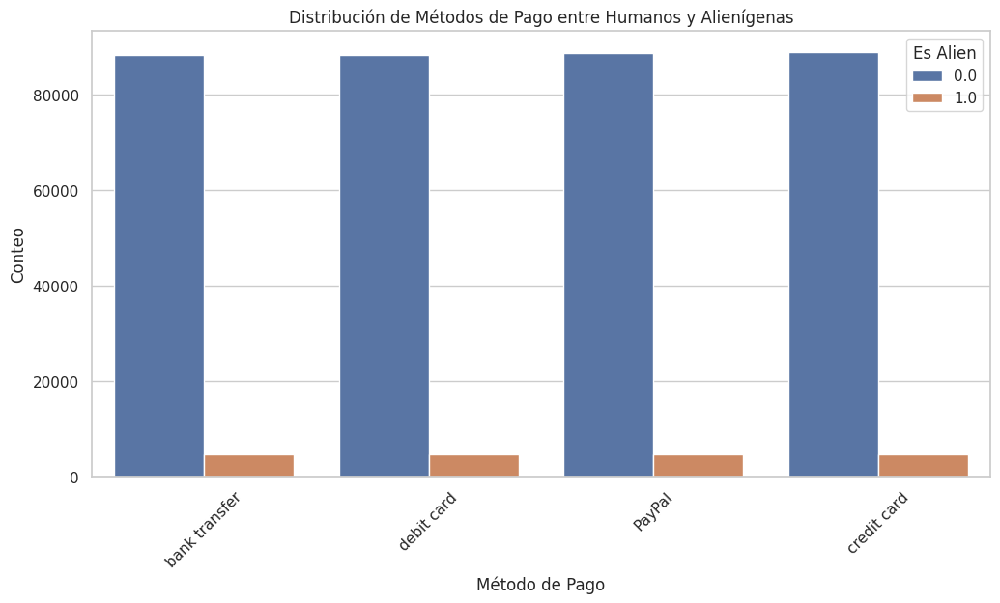

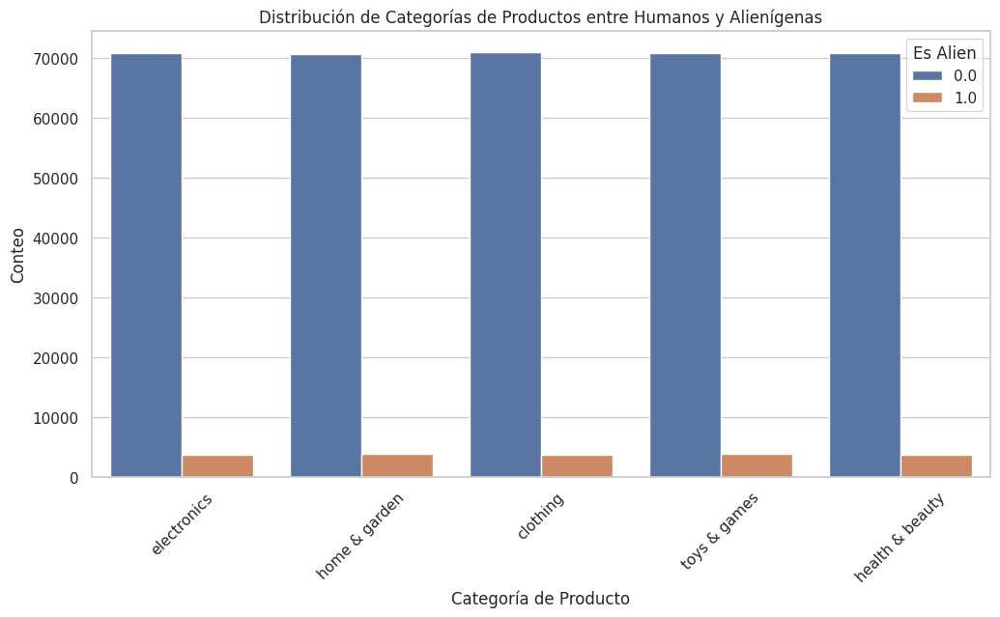

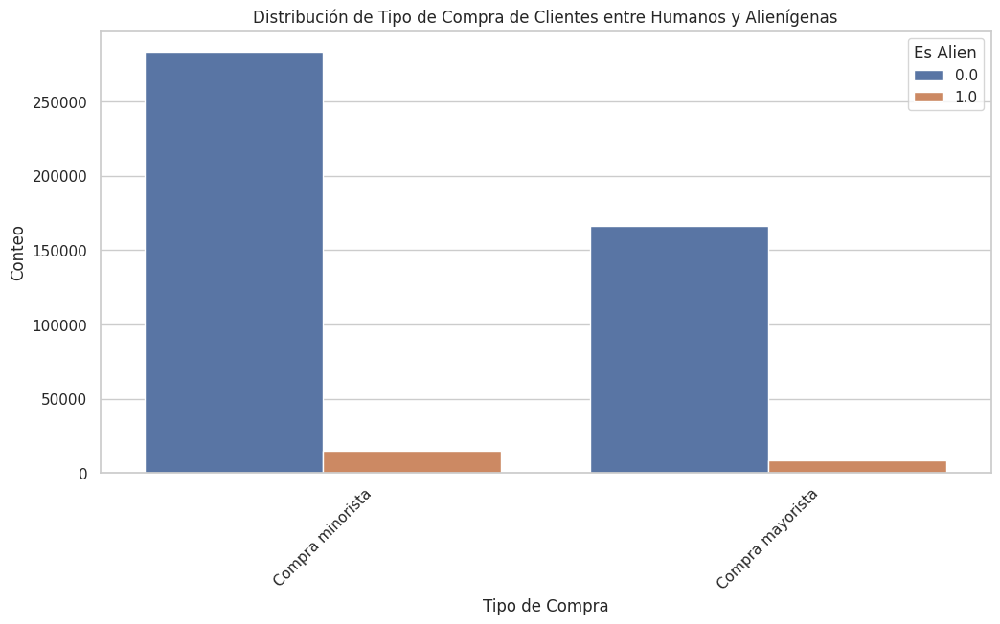

In [70]:
import matplotlib.pyplot as plt
import seaborn as sns

# estilo de los gráficos
sns.set(style="whitegrid")

# 1er gráfico de barras para 'Payment Method'
plt.figure(figsize=(12, 6))
sns.countplot(x='Payment Method', hue='Is An Alien', data=df22)
plt.title('Distribución de Métodos de Pago entre Humanos y Alienígenas')
plt.xlabel('Método de Pago')
plt.ylabel('Conteo')
plt.xticks(rotation=45)
plt.legend(title='Es Alien', loc='upper right')
plt.show()

# 2do gráfico de barras para 'Product Category'
plt.figure(figsize=(12, 6))
sns.countplot(x='Product Category', hue='Is An Alien', data=df22)
plt.title('Distribución de Categorías de Productos entre Humanos y Alienígenas')
plt.xlabel('Categoría de Producto')
plt.ylabel('Conteo')
plt.xticks(rotation=45)
plt.legend(title='Es Alien', loc='upper right')
plt.show()

# 3er gráfico de barras para 'Type of purchase'
plt.figure(figsize=(12, 6))
sns.countplot(x='Type of purchase', hue='Is An Alien', data=df22)
plt.title('Distribución de Tipo de Compra de Clientes entre Humanos y Alienígenas')
plt.xlabel('Tipo de Compra')
plt.ylabel('Conteo')
plt.xticks(rotation=45)
plt.legend(title='Es Alien', loc='upper right')
plt.show()

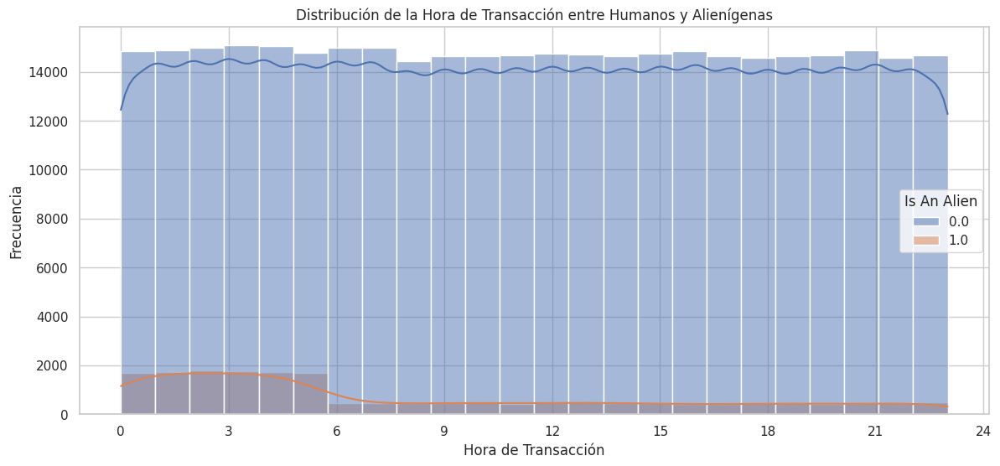

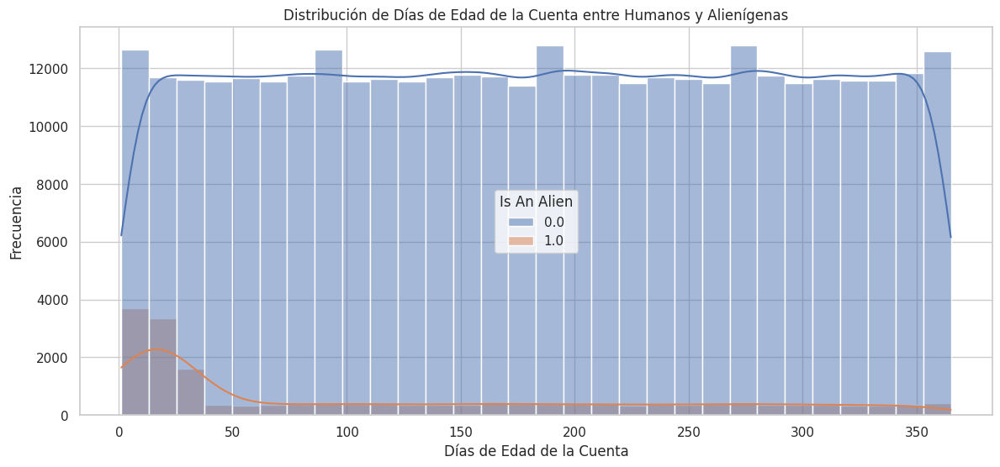

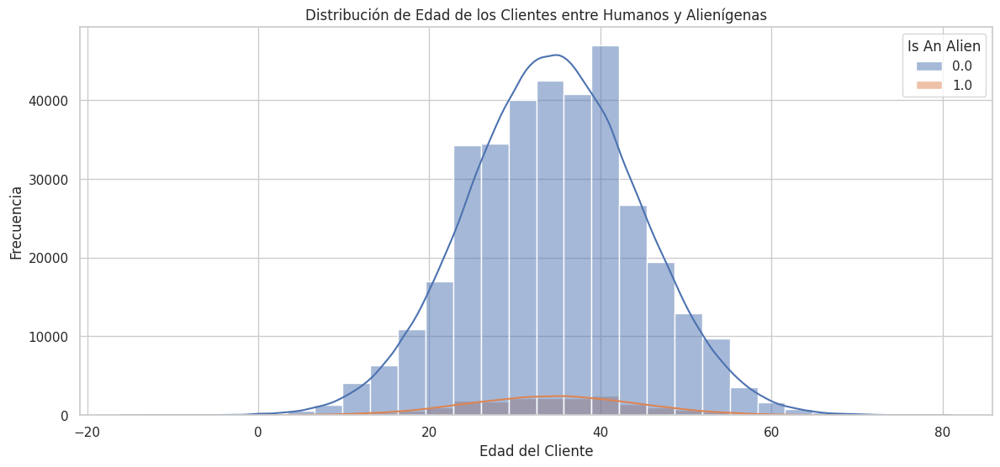

In [71]:
# 1 - Distribución de 'Transaction Hour'
plt.figure(figsize=(14, 6))
sns.histplot(data=df22, x='Transaction Hour', hue='Is An Alien', kde=True, bins=24)
plt.title('Distribución de la Hora de Transacción entre Humanos y Alienígenas')
plt.xlabel('Hora de Transacción')
plt.ylabel('Frecuencia')
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(integer=True))
plt.show()

# 2 - Distribución de 'Account Age Days'
plt.figure(figsize=(14, 6))
sns.histplot(data=df22, x='Account Age Days', hue='Is An Alien', kde=True, bins=30)
plt.title('Distribución de Días de Edad de la Cuenta entre Humanos y Alienígenas')
plt.xlabel('Días de Edad de la Cuenta')
plt.ylabel('Frecuencia')
plt.show()

# 3 - Distribución de 'Customer Age'
plt.figure(figsize=(14, 6))
sns.histplot(data=df22, x='Customer Age', hue='Is An Alien', kde=True, bins=30)
plt.title('Distribución de Edad de los Clientes entre Humanos y Alienígenas')
plt.xlabel('Edad del Cliente')
plt.ylabel('Frecuencia')
plt.show()

Transacciones por método de pago

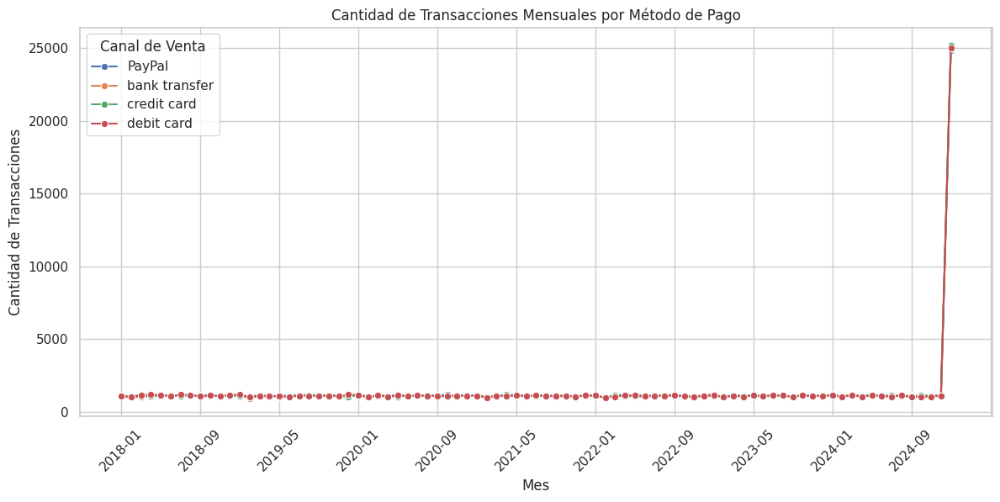

In [72]:
df22['Transaction Date'] = pd.to_datetime(df22['Transaction Date'])

df22['Year-Month'] = df22['Transaction Date'].dt.to_period('M')
df22['Year-Month'] = df22['Year-Month'].astype(str)

monthly_transactions = df22.groupby(['Year-Month', 'Payment Method']).size().reset_index(name='Transaction Count')

plt.figure(figsize=(14, 6))
sns.lineplot(data=monthly_transactions, x='Year-Month', y='Transaction Count', hue='Payment Method', marker='o')
plt.title('Cantidad de Transacciones Mensuales por Método de Pago')
plt.xlabel('Mes')
plt.ylabel('Cantidad de Transacciones')
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(nbins=15, integer=True))
plt.xticks(rotation=45)
plt.legend(title='Canal de Venta')
plt.show()

Productos Más Vendidos por Método de Pago

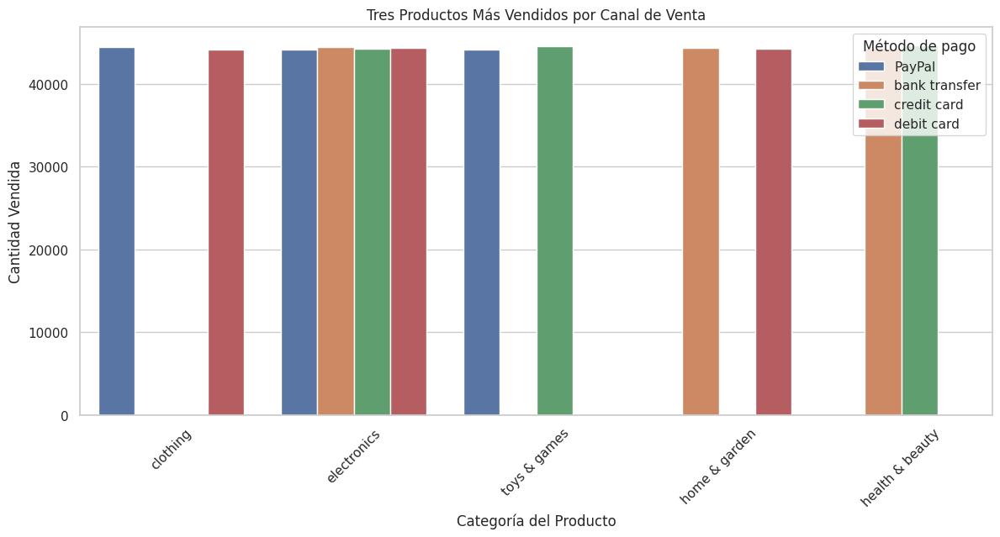

In [73]:
product_sales = df22.groupby(['Product Category', 'Payment Method'])['Quantity'].sum().reset_index()
top_products = product_sales.groupby('Payment Method').apply(lambda x: x.nlargest(3, 'Quantity')).reset_index(drop=True)

plt.figure(figsize=(14, 6))
sns.barplot(data=top_products, x='Product Category', y='Quantity', hue='Payment Method')
plt.title('Tres Productos Más Vendidos por Canal de Venta')
plt.xlabel('Categoría del Producto')
plt.ylabel('Cantidad Vendida')
plt.xticks(rotation=45)
plt.legend(title='Método de pago')
plt.show()

Distribución de la Cantidad de Transacción por Hora del Día

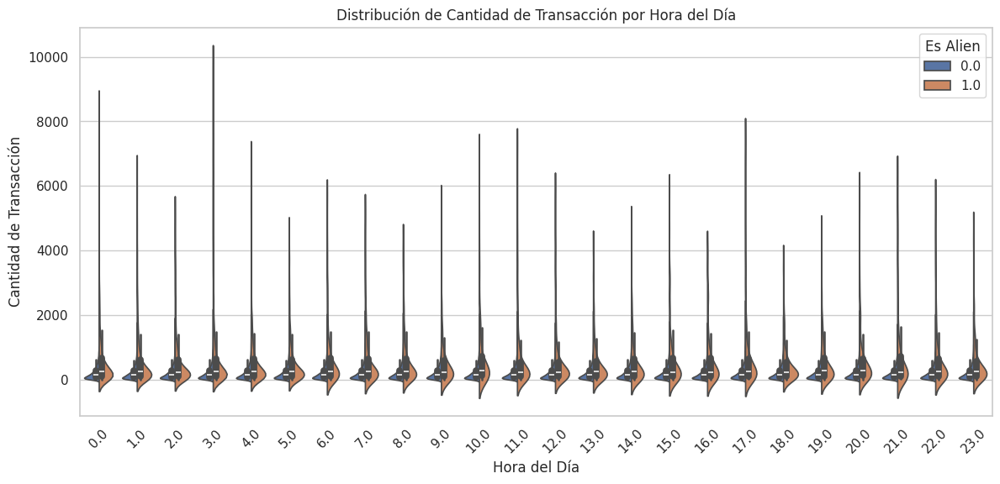

In [74]:
plt.figure(figsize=(14, 6))
sns.violinplot(data=df22, x='Transaction Hour', y='Transaction Amount', hue='Is An Alien', split=True)
plt.title('Distribución de Cantidad de Transacción por Hora del Día')
plt.xlabel('Hora del Día')
plt.ylabel('Cantidad de Transacción')
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(nbins=24, integer=True))
plt.xticks(rotation=45)
plt.legend(title='Es Alien')
plt.show()

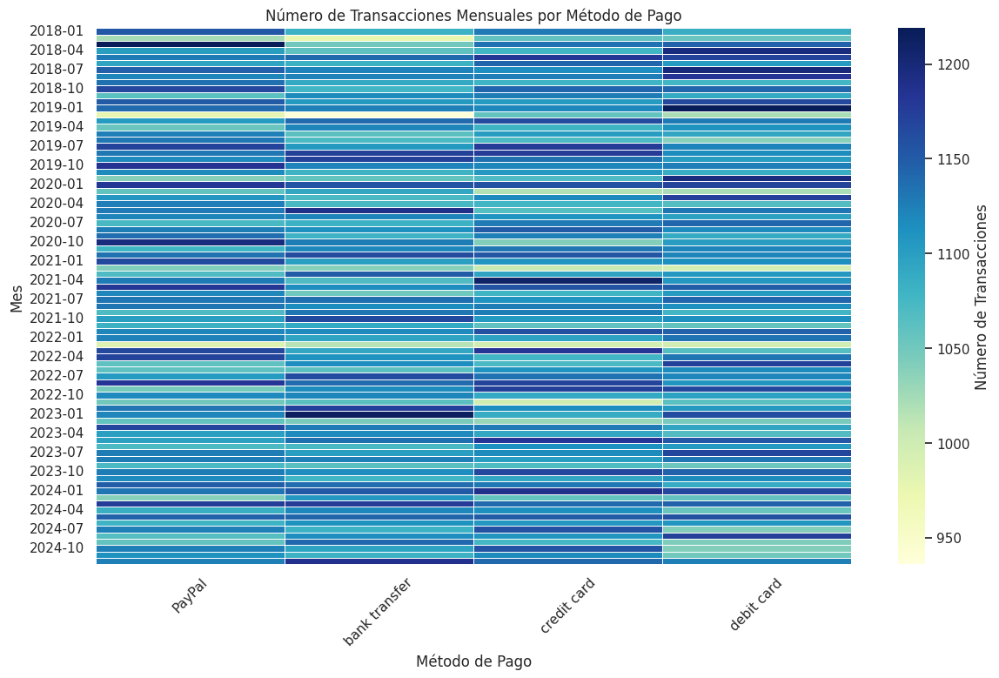

In [90]:
df22['Year-Month'] = df22['Transaction Date'].dt.to_period('M')
#df22['Year-Month'] = df22['Year-Month'].astype(str)

monthly_transactions = df22.groupby(['Year-Month', 'Payment Method']).size().reset_index(name='Transaction Count')

heatmap_data = monthly_transactions.pivot_table(index='Year-Month', columns='Payment Method', values='Transaction Count', aggfunc='sum')
heatmap_data = heatmap_data.fillna(0)

heatmap_data.index = heatmap_data.index.astype(str)
heatmap_data = heatmap_data.sort_index()

plt.figure(figsize=(14, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu', linewidths=0.5, cbar_kws={'label': 'Número de Transacciones'})
plt.title('Número de Transacciones Mensuales por Método de Pago')
plt.xlabel('Método de Pago')
plt.ylabel('Mes')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

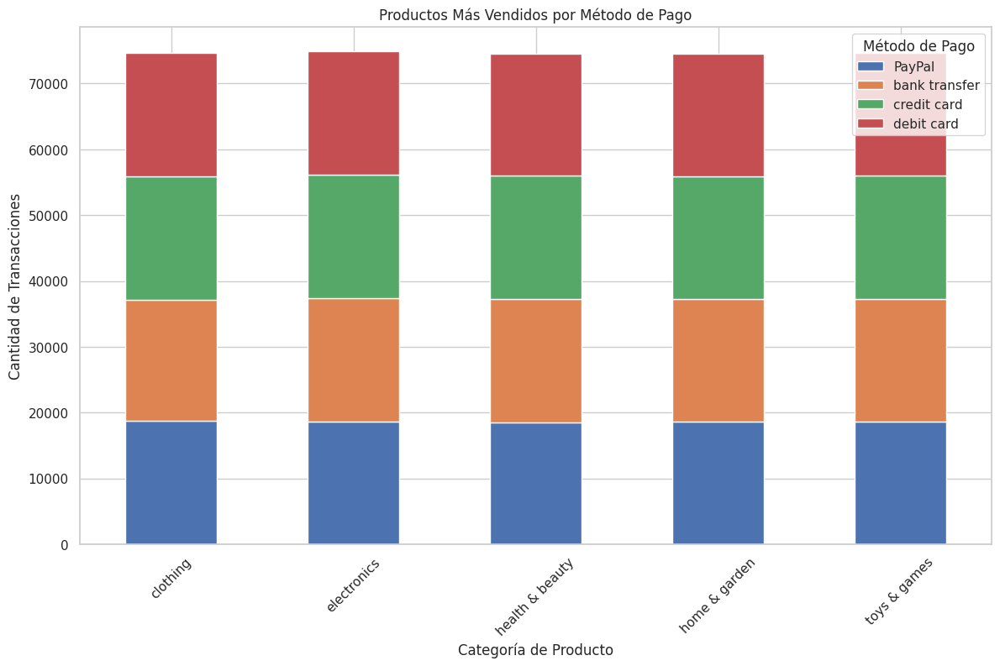

In [76]:
top_products = df22.groupby(['Product Category', 'Payment Method']).size().reset_index(name='Transaction Count')

pivot_data = top_products.pivot_table(index='Product Category', columns='Payment Method', values='Transaction Count', fill_value=0)

pivot_data.plot(kind='bar', stacked=True, figsize=(14, 8))
plt.title('Productos Más Vendidos por Método de Pago')
plt.xlabel('Categoría de Producto')
plt.ylabel('Cantidad de Transacciones')
plt.xticks(rotation=45)
plt.legend(title='Método de Pago')
plt.show()

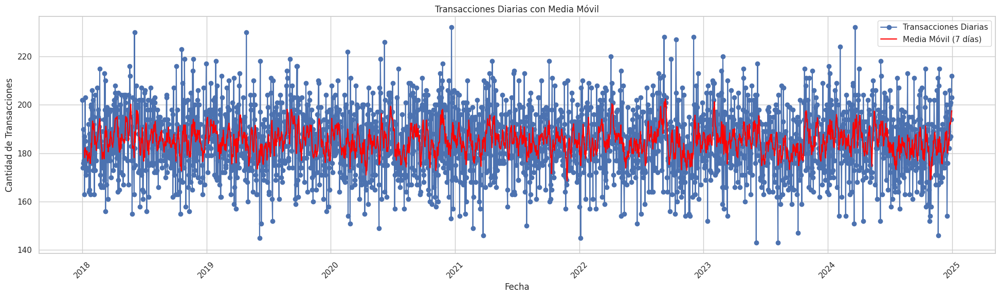

In [91]:
daily_transactions = df22.groupby(df22['Transaction Date'].dt.date).size().reset_index(name='Transaction Count')

# Calcular la media móvil
daily_transactions['Rolling Mean'] = daily_transactions['Transaction Count'].rolling(window=7).mean()

plt.figure(figsize=(24, 6))
plt.plot(daily_transactions['Transaction Date'], daily_transactions['Transaction Count'], label='Transacciones Diarias', marker='o')
plt.plot(daily_transactions['Transaction Date'], daily_transactions['Rolling Mean'], label='Media Móvil (7 días)', color='red')
plt.title('Transacciones Diarias con Media Móvil')
plt.xlabel('Fecha')
plt.ylabel('Cantidad de Transacciones')
plt.legend()
plt.xticks(rotation=45)
plt.show()

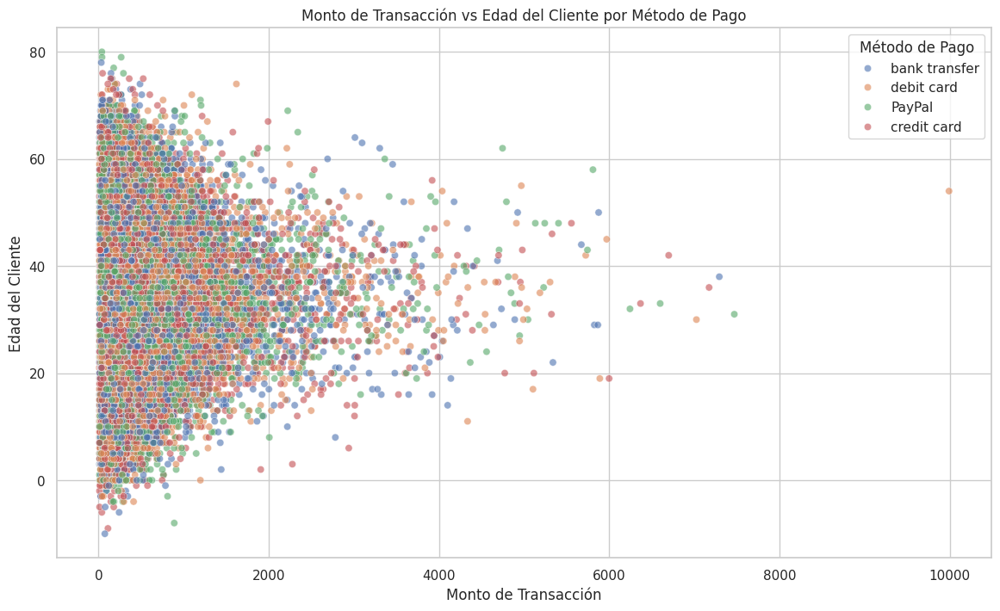

In [78]:
plt.figure(figsize=(14, 8))
sns.scatterplot(data=df22, x='Transaction Amount', y='Customer Age', hue='Payment Method', alpha=0.6)
plt.title('Monto de Transacción vs Edad del Cliente por Método de Pago')
plt.xlabel('Monto de Transacción')
plt.ylabel('Edad del Cliente')
plt.legend(title='Método de Pago')
plt.show()

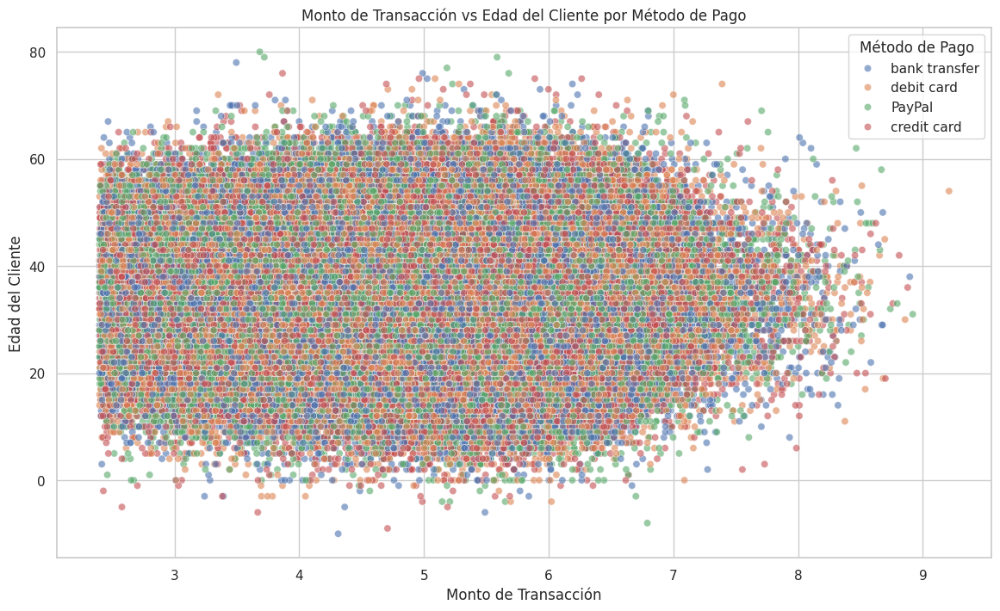

In [79]:
import numpy as np

df22['log_monto'] = df22['Transaction Amount'].apply(lambda x: np.log(x + 1))

plt.figure(figsize=(14, 8))
sns.scatterplot(data=df22, x='log_monto', y='Customer Age', hue='Payment Method', alpha=0.6)
plt.title('Monto de Transacción vs Edad del Cliente por Método de Pago')
plt.xlabel('Monto de Transacción')
plt.ylabel('Edad del Cliente')
plt.legend(title='Método de Pago')
plt.show()

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



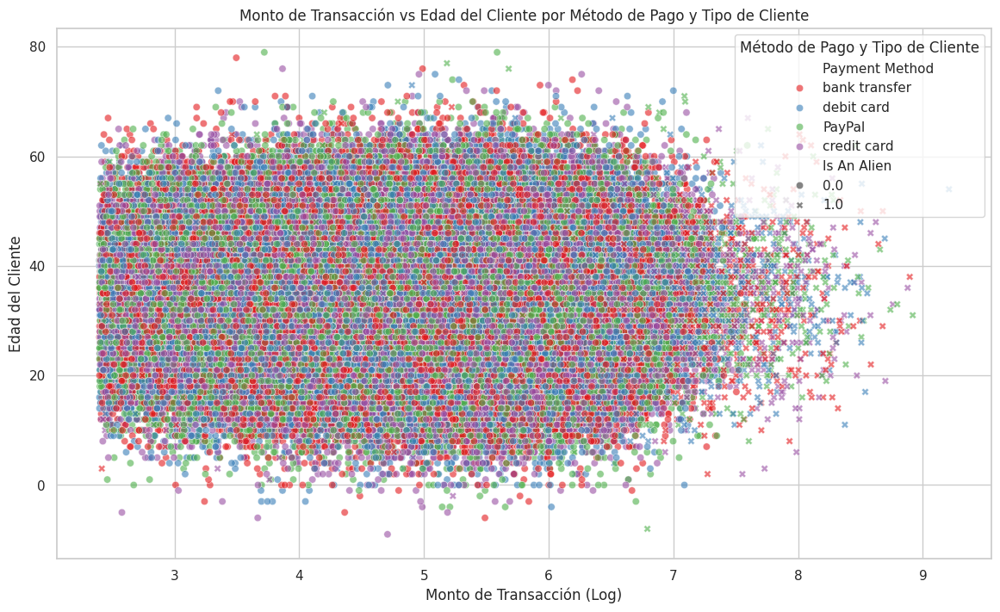

In [80]:
plt.figure(figsize=(14, 8))
sns.scatterplot(
    data=df22,
    x='log_monto',
    y='Customer Age',
    hue='Payment Method',
    style='Is An Alien',  # Diferenciar si es alienígena o no
    palette='Set1',       # paleta de colores
    alpha=0.6
)
plt.title('Monto de Transacción vs Edad del Cliente por Método de Pago y Tipo de Cliente')
plt.xlabel('Monto de Transacción (Log)')
plt.ylabel('Edad del Cliente')
plt.legend(title='Método de Pago y Tipo de Cliente')
plt.show()

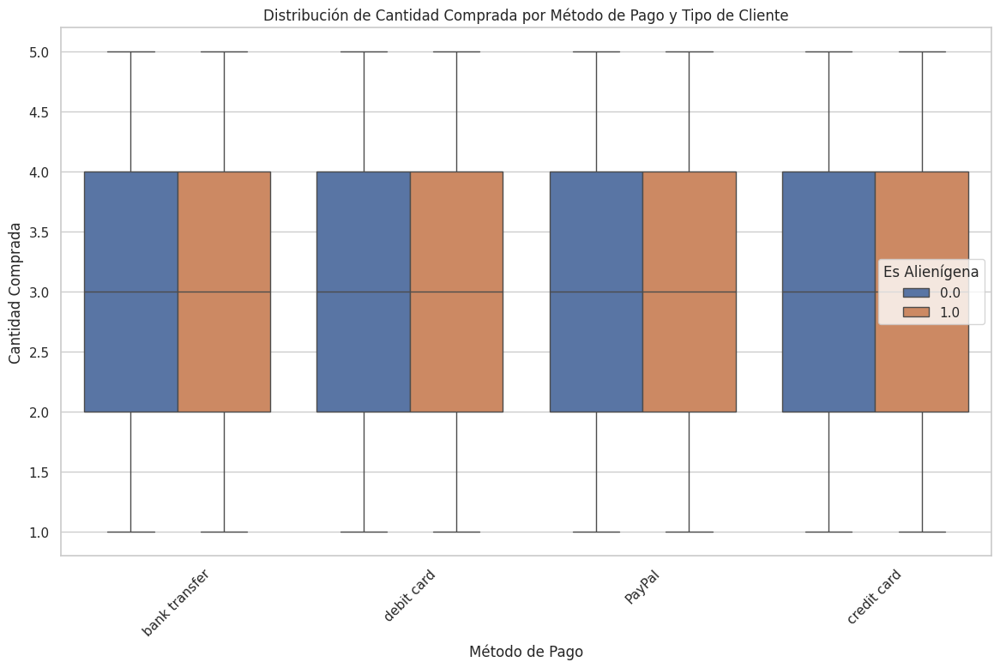

In [81]:
import seaborn as sns
import matplotlib.pyplot as plt

# Crear gráfico de cajas diferenciando entre si es alienígena o no
plt.figure(figsize=(14, 8))
sns.boxplot(data=df22, x='Payment Method', y='Quantity', hue='Is An Alien')
plt.title('Distribución de Cantidad Comprada por Método de Pago y Tipo de Cliente')
plt.xlabel('Método de Pago')
plt.ylabel('Cantidad Comprada')
plt.xticks(rotation=45)
plt.legend(title='Es Alienígena')
plt.show()

### Otros

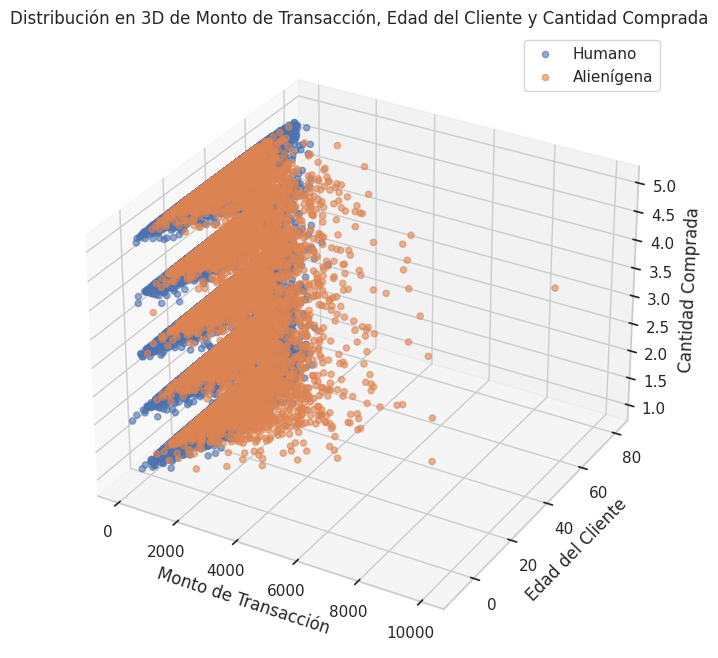

In [82]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(14, 8))
ax = fig.add_subplot(111, projection='3d')

# Filtra los datos para humanos y alienígenas
human_data = df22[df22['Is An Alien'] == 0]
alien_data = df22[df22['Is An Alien'] == 1]

# Graficar humanos
ax.scatter(human_data['Transaction Amount'], human_data['Customer Age'], human_data['Quantity'], label='Humano', alpha=0.6)
# Graficar alienígenas
ax.scatter(alien_data['Transaction Amount'], alien_data['Customer Age'], alien_data['Quantity'], label='Alienígena', alpha=0.6)

ax.set_xlabel('Monto de Transacción')
ax.set_ylabel('Edad del Cliente')
ax.set_zlabel('Cantidad Comprada')
plt.title('Distribución en 3D de Monto de Transacción, Edad del Cliente y Cantidad Comprada')
plt.legend()
plt.show()

In [83]:
import plotly.graph_objs as go
import pandas as pd

# Filtra los datos para humanos y alienígenas
human_data = df22[df22['Is An Alien'] == 0]
alien_data = df22[df22['Is An Alien'] == 1]

# Crear las trazas para humanos y alienígenas
trace_human = go.Scatter3d(
    x=human_data['Transaction Amount'],
    y=human_data['Customer Age'],
    z=human_data['Quantity'],
    mode='markers',
    marker=dict(size=5, color='blue', opacity=0.6),
    name='Humano'
)

trace_alien = go.Scatter3d(
    x=alien_data['Transaction Amount'],
    y=alien_data['Customer Age'],
    z=alien_data['Quantity'],
    mode='markers',
    marker=dict(size=5, color='red', opacity=0.6),
    name='Alienígena'
)

# Configuración del layout
layout = go.Layout(
    title='Distribución en 3D de Monto de Transacción, Edad del Cliente y Cantidad Comprada',
    scene=dict(
        xaxis_title='Monto de Transacción',
        yaxis_title='Edad del Cliente',
        zaxis_title='Cantidad Comprada'
    )
)

# Crear la figura
fig = go.Figure(data=[trace_human, trace_alien], layout=layout)

# Mostrar el gráfico interactivo
fig.show()

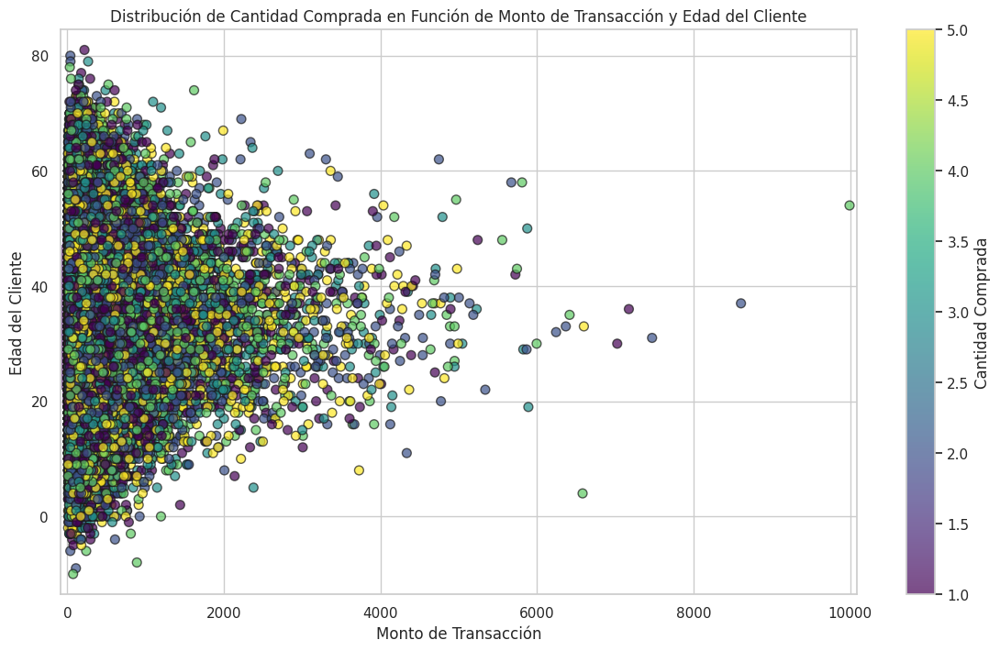

In [84]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(14, 8))

# Crear gráfico de densidad 2D con KDE
sns.kdeplot(data=df22, x='Transaction Amount', y='Customer Age', cmap='viridis', fill=True, alpha=0.6)

# Agregar gráfico de dispersión
plt.scatter(df22['Transaction Amount'], df22['Customer Age'], c=df22['Quantity'], s=50, edgecolor='k', cmap='viridis', alpha=0.7)

# Configurar etiquetas y título
plt.xlabel('Monto de Transacción')
plt.ylabel('Edad del Cliente')
plt.title('Distribución de Cantidad Comprada en Función de Monto de Transacción y Edad del Cliente')

# Mostrar barra de color
plt.colorbar(label='Cantidad Comprada')

# Mostrar gráfico
plt.show()

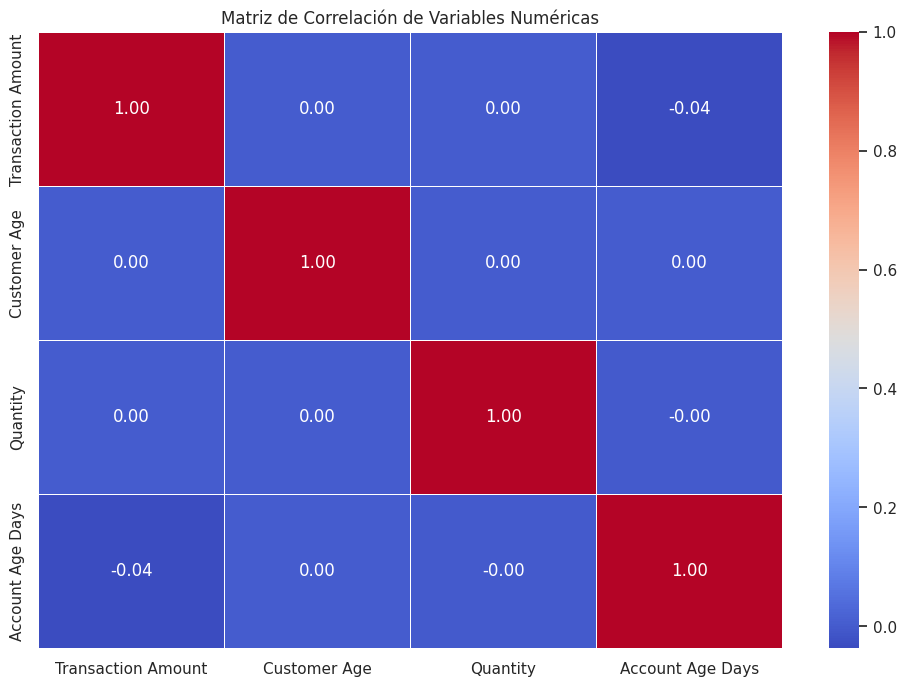

In [85]:
import seaborn as sns
import matplotlib.pyplot as plt

# Selecciona las columnas numéricas para la matriz de correlación
numeric_columns = ['Transaction Amount', 'Customer Age', 'Quantity', 'Account Age Days']

# Calcula la matriz de correlación
correlation_matrix = df22[numeric_columns].corr()

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Matriz de Correlación de Variables Numéricas')
plt.show()

<ipython-input-86-38d4990453b2>:8: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




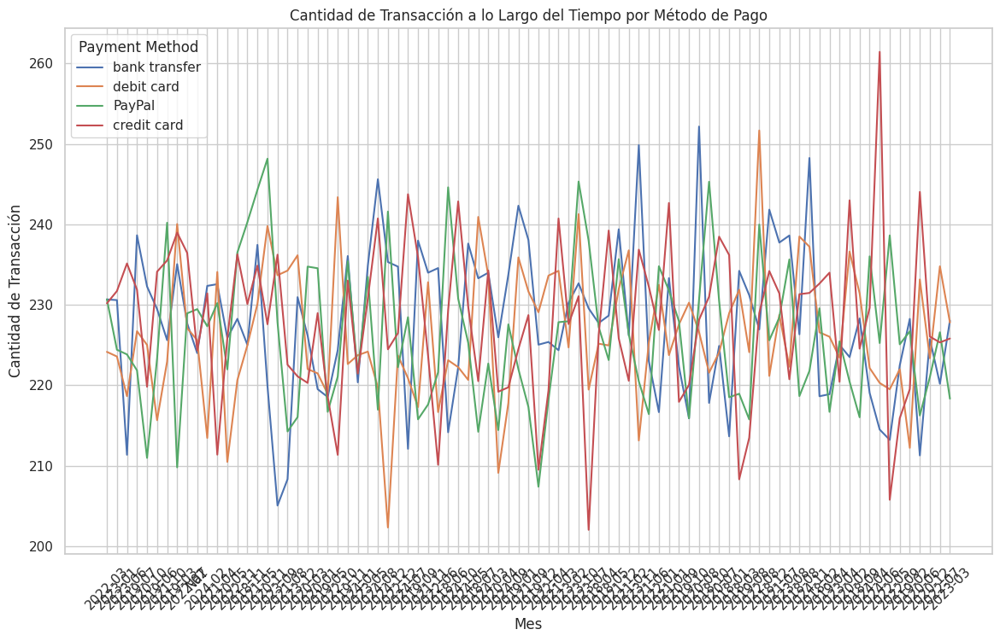

In [86]:
import seaborn as sns
import matplotlib.pyplot as plt

# Extraer mes y año para el análisis de series temporales
df22['Year-Month'] = df22['Transaction Date'].dt.to_period('M').astype(str)

plt.figure(figsize=(14, 8))
sns.lineplot(data=df22, x='Year-Month', y='Transaction Amount', hue='Payment Method', ci=None)
plt.title('Cantidad de Transacción a lo Largo del Tiempo por Método de Pago')
plt.xlabel('Mes')
plt.ylabel('Cantidad de Transacción')
plt.xticks(rotation=45)
plt.show()

### 5. Particiones y consultas en SQL [2 puntos]

<center>
<img src="https://gitlab.com/imezadelajara/datos_clase_7_mds7202/-/raw/main/misc_images/1696330143457.gif" width=400 />

El equipo de Bodoque e-shop ha solicitado que los datos estén disponibles en una tabla SQL consultable. Además, están interesados en aprovechar las funciones de ventana en SQL para análisis avanzados. Las funciones de ventana permiten realizar cálculos sobre un conjunto de filas que están relacionadas con la fila actual. Por ejemplo, UNBOUNDED PRECEDING se usa para indicar que el rango de la función de ventana comienza desde la primera fila de la partición o del conjunto de resultados, lo cual es útil para calcular sumas acumulativas hasta la fila actual. Las variaciones comunes de este uso incluyen:

- `UNBOUNDED PRECEDING` to `CURRENT ROW`: Calcula desde el inicio de la partición hasta la fila actual.
- `UNBOUNDED PRECEDING` to `UNBOUNDED FOLLOWING`: Cubre todas las filas dentro de la partición.
- `VALUE PRECEDING` to `VALUE FOLLOWING`: Establece un rango específico basado en valores antes y después de la fila actual.

<center>
<img src="https://learnsql.com/blog/sql-window-functions-rows-clause/1.png" width=500 />

Ejemplo de uso en SQL:

```sql
STAT(COL1_NAME) OVER (PARTITION BY COL2_NAME ORDER BY COL3_NAME ROWS BETWEEN X PRECEDING AND CURRENT ROW)
```


Responda y realice los siguientes puntos:

1. **Creación de Tabla con PySpark** (2 puntos):
   - Desarrolle un script utilizando PySpark para crear una tabla a partir de un DataFrame previamente transformado. Seleccione y utilice una variable específica para la partición de la tabla. Justifique su elección de esta variable considerando factores como el tamaño del DataFrame, la distribución de los datos y el impacto potencial en el rendimiento de futuras consultas.

2. **Consulta SQL para Principales Clientes** (Bonus: 2 punto):
   - Ejecute una consulta SQL para identificar los 10 clientes que más productos han comprado. La consulta debe retornar el ID del cliente junto con el total de productos comprados, ordenados en forma descendente.

3. **Implementación de Función de Ventana en SQL y Equivalente en Spark** (Bonus: 2 punto):
   - Implemente una función de ventana en SQL para calcular la compra más alta realizada por cada usuario en los últimos tres meses. Además, describa cómo se podría realizar una función equivalente en Spark, considerando las capacidades específicas de PySpark para manejar este tipo de consultas.



In [87]:
# Código Aquí

### 6. UDF [12 puntos]

<center>
<img src="https://64.media.tumblr.com/ba8c705edd2bed0a28d9458811155d69/tumblr_pap19zg4ae1w3zg6go1_400.gifv" width=400 />



Un experto en predicciones y programación le ha proporcionado un objeto serializado (`pickle`) diseñado para calcular las probabilidades de que un cliente cometa o no un fraude. Este experto sugiere que, para maximizar las capacidades de procesamiento distribuido de Spark, debería implementar `Scalar User Defined Functions` (udf). Esto le permitirá aplicar el objeto serializado en un entorno distribuido a lo largo de toda la población de datos. Un aspecto clave de la función desarrollada por el experto es que se enfoca exclusivamente en las siguientes columnas para realizar las predicciones: `['Transaction Amount', 'Quantity', 'Customer Age', 'Transaction Hour']`.

Aparte, el experto le proporciona las siguientes instrucciones para usar las UDF en Spark:

```python
from pyspark.sql.functions import udf
from pyspark.sql.types import FloatType

def custom_function(col1, col2, col3, col4):
    pass

udf_function = udf(custom_function, FloatType())
```

Basándose en la estructura proporcionada, debe desarrollar una función que ejecute un código específico. Tenga en cuenta que esta función solo puede recibir columnas de Spark y debe retornar el valor deseado. Posteriormente, deberá utilizar esta función UDF indicando la función personalizada y el formato de salida.

Siga los siguientes pasos para implementar la solución y responda las preguntas:

1. **Cargar el objeto serializado**: Revise el tipo de objeto y deduzca su función. (1 punto)
2. **Explorar el objeto**: Utilice las funciones `dir` y `help` para identificar qué método del objeto predice la probabilidad. (1 punto)
3. **Crear una función personalizada**: Elabore una función que prediga la probabilidad de fraude utilizando el último valor de la lista generada por el objeto serializado. Puede modificar el nombre de la función para reflejar su propósito. (6 puntos)
4. **Definir la función UDF**: Establezca la función UDF con la función personalizada que ha creado. (2 punto)
5. **Generar una nueva columna**: Añada una nueva columna `prediction` a su DataFrame en Spark utilizando la función UDF y muestre un ejemplo de cómo se aplica. ¿Qué beneficios podría generar utilizar udf? (2 puntos)

In [88]:
# Código Aquí